In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
prefix=["","_LSTMMLP","_CNNMLP"]
path = "results"


In [3]:
freq_arrays = np.genfromtxt("TTF_freq.csv", delimiter=',')

In [4]:
def text_Vs(Vs_soil, h_soil, Vs_bedrock):
    return f"Vs1: {Vs_soil:.0f} m/s with h: {h_soil:.0f} m\nVs2: {Vs_bedrock:.0f} m/s"

In [5]:
target_total = []
prediction_total = []
hsoil_total = []
Vs_soil_total = []
Vs_bedrock_total = []
correlation_total = []

for p in prefix:
    target = np.genfromtxt(f"results/target{p}.csv", delimiter=',')
    prediction = np.genfromtxt(f"results/predicted{p}.csv", delimiter=',')
    hsoil = np.genfromtxt(f"results/h_soil{p}.csv", delimiter=',')
    Vs_soil = np.genfromtxt(f"results/Vs_soil{p}.csv", delimiter=',')
    Vs_bedrock = np.genfromtxt(f"results/Vs_bedrock{p}.csv", delimiter=',')
    correlation = np.genfromtxt(f"results/correlation{p}.csv", delimiter=',')

    #Append to total
    target_total.append(target)
    prediction_total.append(prediction)
    hsoil_total.append(hsoil)
    Vs_soil_total.append(Vs_soil)
    Vs_bedrock_total.append(Vs_bedrock)
    correlation_total.append(correlation)

In [6]:
prefix[0]="_Baseline"

In [16]:
sns.set_theme()

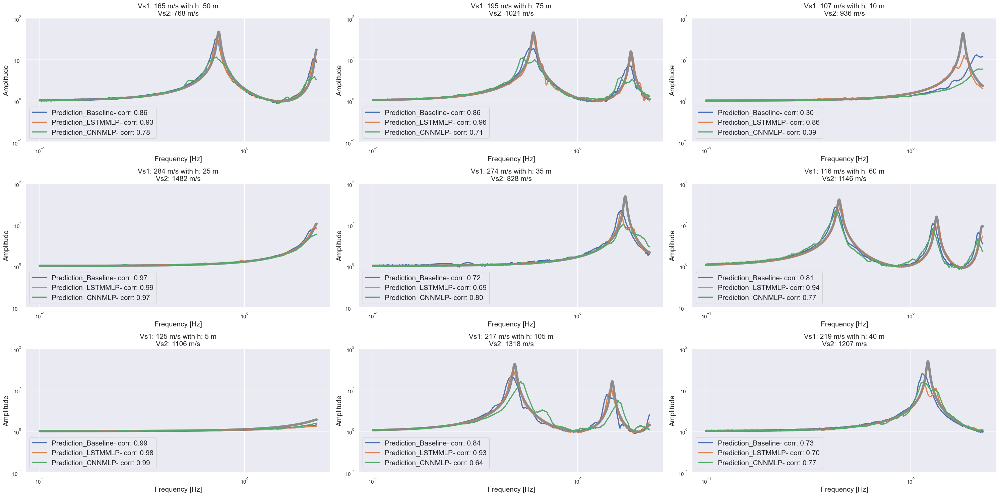

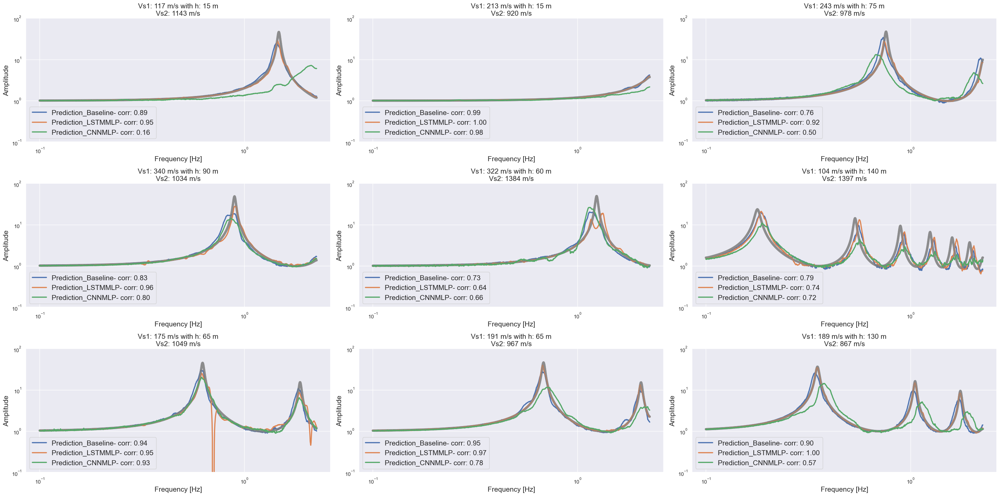

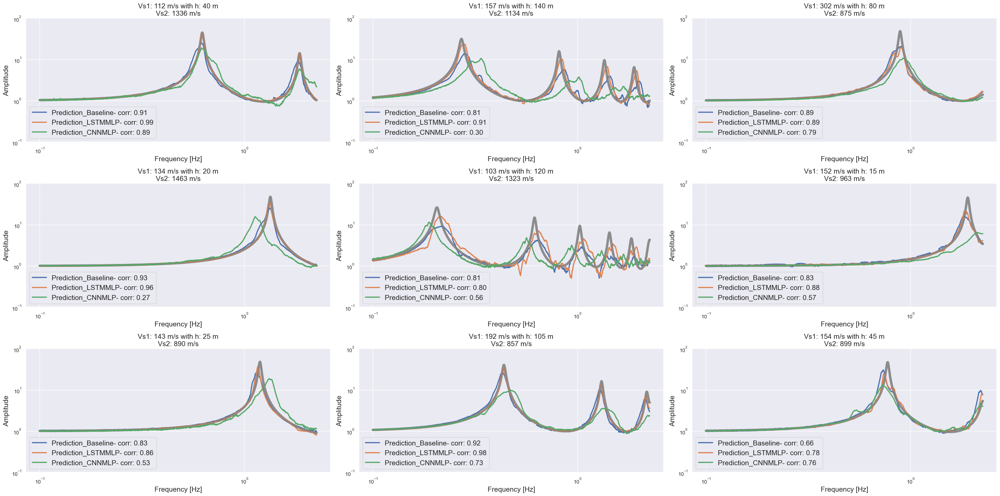

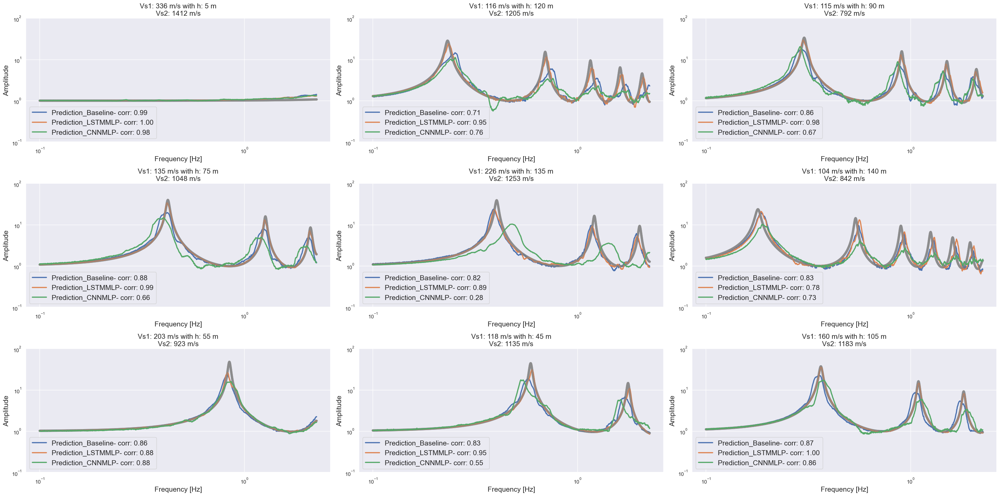

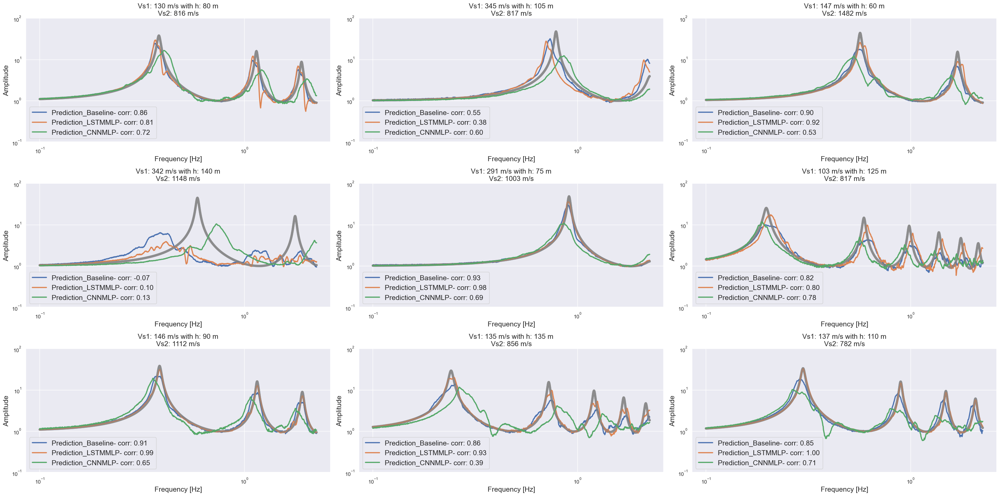

...

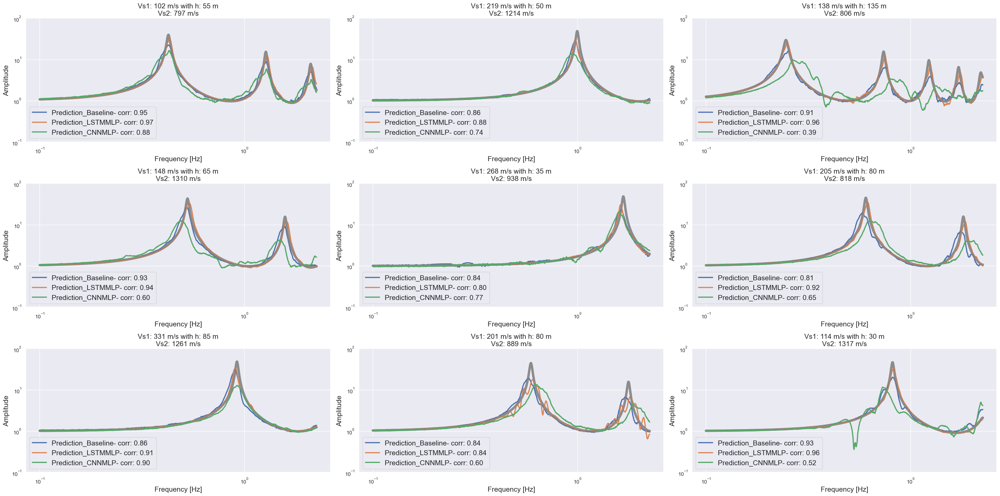

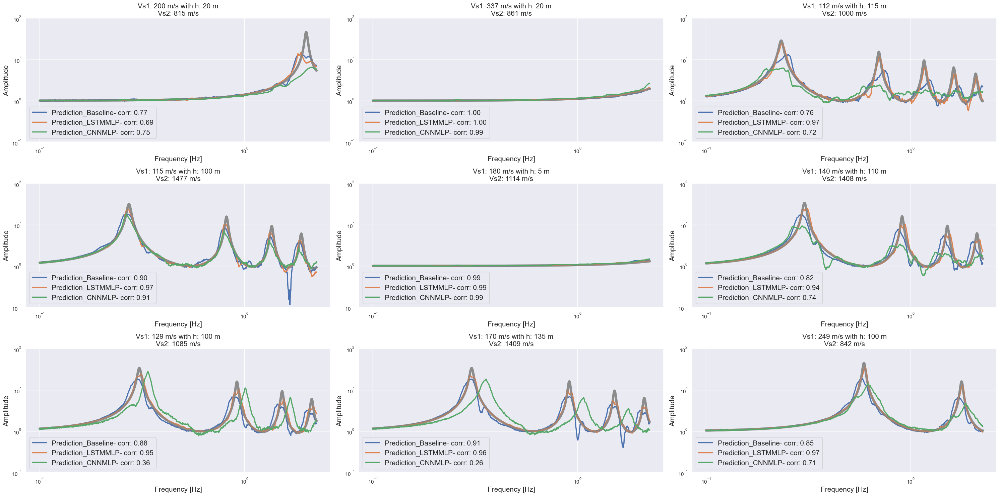

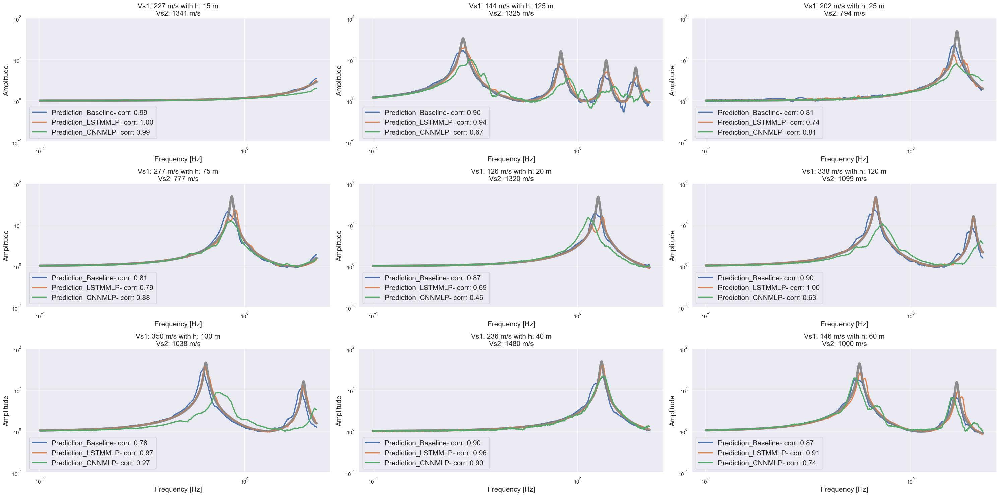

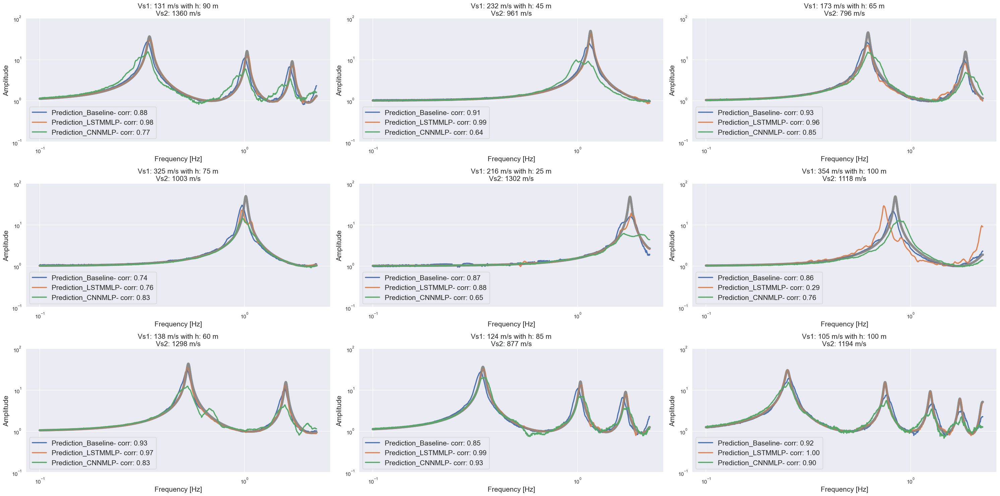

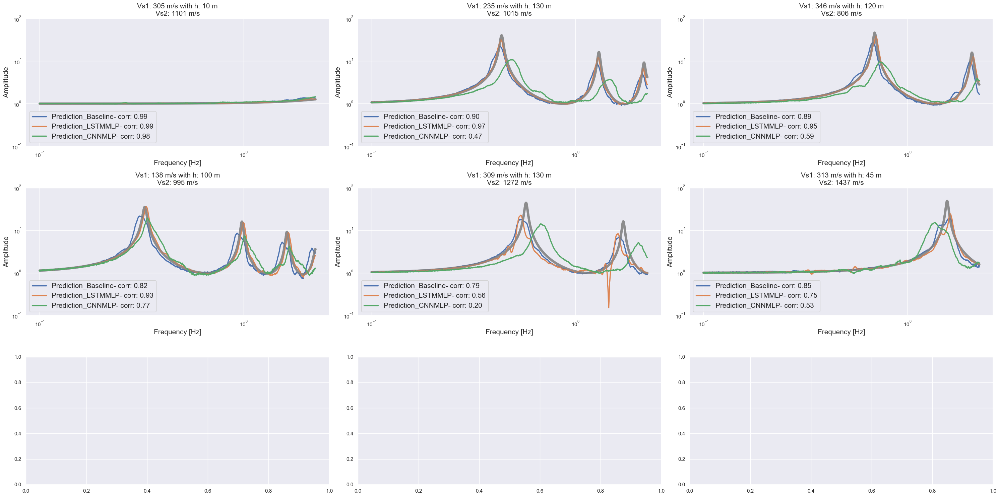

In [17]:
import matplotlib.pyplot as plt

# Number of subplots per figure
plots_per_figure = 9

# Calculate the number of figures needed
num_figures = (150 + plots_per_figure - 1) // plots_per_figure

for fig_num in range(num_figures):
    fig, axs = plt.subplots(3, 3, figsize=(30, 15))
    axs = axs.flatten()
    
    for subplot_num in range(plots_per_figure):
        k = fig_num * plots_per_figure + subplot_num
        if k >= 150:
            break
        for i in range(3):
            axs[subplot_num].loglog(freq_arrays, target_total[i][k], color='gray', alpha=0.5, linewidth=5)
            axs[subplot_num].loglog(freq_arrays, prediction_total[i][k], linewidth=2.5, 
                                    label=f"Prediction{prefix[i]}- corr: {correlation_total[i][k]:.2f}")
            axs[subplot_num].set_title(text_Vs(Vs_soil_total[i][k], hsoil_total[i][k], Vs_bedrock_total[i][k]), fontsize=15)
            axs[subplot_num].set_xlabel("Frequency [Hz]", fontsize=15)
            axs[subplot_num].set_ylabel("Amplitude", fontsize=15)
            axs[subplot_num].legend(fontsize=15, loc='lower left')
            axs[subplot_num].set_ylim([1e-1, 1e2])
    
    plt.tight_layout()
    plt.show()

In [ ]:
# Early stopping
class EarlyStopping():
    def __init__(self, patience=5, delta=0.0, progress_bar=None):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta
        self.progress_bar = progress_bar

    def __call__(self, val_loss, model):
        if self.best_score is None:
            self.best_score = val_loss
        elif val_loss > self.best_score + self.delta:
            self.counter += 1
            if self.progress_bar:
                self.progress_bar.set_postfix_str(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = val_loss
            self.counter = 0
            if self.progress_bar:
                self.progress_bar.set_postfix_str('')